In [33]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split


In [34]:
import mysql.connector
import time
import warnings
warnings.simplefilter(action='ignore', category=UserWarning)


mydb = mysql.connector.connect(
  host="localhost",
  user="root",
  password="password",
  database="valorant_tracker"
)
cursor = mydb.cursor()

  

In [35]:
df = pd.read_sql("SELECT * FROM stats", mydb)
print("Number of samples: " + str(df.shape[0]))
#1293868

Number of samples: 1486070


In [36]:
#add a username column
df['user_id'] = df['match_player_id'].str[36:]

print(df['user_id'])

0          Assertful on YT#ttv
1          Assertful on YT#ttv
2          Assertful on YT#ttv
3          Assertful on YT#ttv
4          Assertful on YT#ttv
                  ...         
1486065      silversparrow#xyz
1486066      silversparrow#xyz
1486067      silversparrow#xyz
1486068      silversparrow#xyz
1486069      silversparrow#xyz
Name: user_id, Length: 1486070, dtype: object


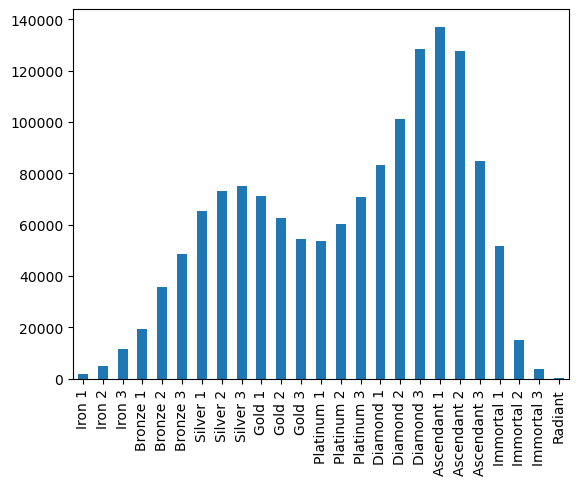

In [37]:
from matplotlib import pyplot as plt 
import seaborn as sns


rank_order = {
    "Iron 1" :      1, 
    "Iron 2" :      2, 
    "Iron 3" :      3, 
    "Bronze 1" :    4,
    "Bronze 2" :    5, 
    "Bronze 3" :    6, 
    "Silver 1" :    7, 
    "Silver 2" :    8, 
    "Silver 3" :    9, 
    "Gold 1" :      10, 
    "Gold 2" :      11, 
    "Gold 3" :      12, 
    "Platinum 1" :  13, 
    "Platinum 2" :  14, 
    "Platinum 3" :  15, 
    "Diamond 1" :   16, 
    "Diamond 2" :   17, 
    "Diamond 3" :   18,
    "Ascendant 1" : 19, 
    "Ascendant 2" : 20, 
    "Ascendant 3" : 21,
    "Immortal 1" :  22, 
    "Immortal 2" :  23, 
    "Immortal 3" :  24, 
    "Radiant" :     25 
}


ImmortalIndex = df[(df['current_rank'] == 'Immortal') | (df['current_rank'] == 'Unranked')].index
df.drop(ImmortalIndex , inplace=True)

#an array of ranks that are currently accounted for in the database
current_ranks = df['current_rank'].unique()
#creates a sorted array of ranks, minus the ranks that have not been accounted for
current_ranks_order = [rank for rank in rank_order if rank in current_ranks]



df.current_rank.value_counts().loc[current_ranks_order].plot.bar()
plt.show()

Users with a higher rank might be more likely to view their ranks (set up their valorant tracker account)

This chart is also based on matches, not individual users so it will not match the true rank distribution. Also as a user generally plays games, they will ~usually increase in rank (find the average rank increase for each user)

In [6]:
print(df['current_rank'].value_counts())

Ascendant 1    137075
Diamond 3      128579
Ascendant 2    127757
Diamond 2      101255
Ascendant 3     84796
Diamond 1       83292
Silver 3        74894
Silver 2        72949
Gold 1          70995
Platinum 3      70771
Silver 1        65309
Gold 2          62603
Platinum 2      60254
Gold 3          54296
Platinum 1      53716
Immortal 1      51880
Bronze 3        48635
Bronze 2        35914
Bronze 1        19349
Immortal 2      15237
Iron 3          11774
Iron 2           5092
Immortal 3       3996
Iron 1           1891
Radiant           115
Name: current_rank, dtype: int64


In [53]:
print(df.columns)


Index(['rounds', 'date', 'result', 'map', 'smurf', 'agent', 'kills',
       'headshots', 'deaths', 'assists', 'damage', 'damage_received',
       'econ_rating', 'plants', 'defuses', 'first_bloods', 'grenade_casts',
       'ability_2_casts', 'ability_1_casts', 'ultimate_casts', 'placement',
       'kdratio', 'headshot_percentage', 'first_deaths', 'last_deaths',
       'current_rank'],
      dtype='object')


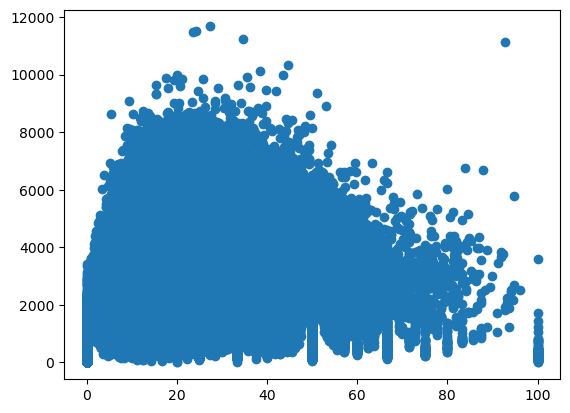

In [71]:
plt.scatter(df['headshot_percentage'], df['damage'])

In [41]:
# One hot encoding
df = df.drop('match_player_id', axis=1)
numeric = df[df.select_dtypes(exclude=['float64', 'int64', 'datetime64[ns]']).columns]
for feature in numeric:
    # if feature != "result":
    #     dummies = pd.get_dummies(df[feature])
    #     df = pd.concat([df, dummies], axis=1)
    #     df = df.drop([feature], axis=1)
    dummies = pd.get_dummies(df[feature])
    df = pd.concat([df, dummies], axis=1)
    df = df.drop([feature], axis=1)
print(df.head)


<bound method NDFrame.head of          rounds                date  smurf  kills  headshots  deaths  assists  \
0            25 2022-11-11 02:15:55      0     21         19      16        2   
1            25 2022-11-11 01:45:45      0      6          3      13        1   
2            25 2022-11-10 19:11:15      0     17         11      16        4   
3            25 2022-11-11 00:39:24      0     15          9      16        2   
4            25 2022-11-10 18:04:47      0     15          5      17        4   
...         ...                 ...    ...    ...        ...     ...      ...   
1486065      25 2022-05-18 13:05:04      0     15          9      18        2   
1486066      25 2022-05-17 21:09:19      0     24          7      16        5   
1486067      25 2022-05-17 14:44:10      0      9          2      16        6   
1486068      25 2022-05-16 23:42:59      0      8          3      19        3   
1486069      25 2022-05-16 00:04:45      0     10          4      20        6  

In [6]:
print(list(df.columns))

['rounds', 'date', 'result', 'smurf', 'kills', 'headshots', 'deaths', 'assists', 'damage', 'damage_received', 'econ_rating', 'plants', 'defuses', 'first_bloods', 'grenade_casts', 'ability_2_casts', 'ability_1_casts', 'ultimate_casts', 'placement', 'kdratio', 'headshot_percentage', 'first_deaths', 'last_deaths', 'Ascent', 'Bind', 'Breeze', 'Fracture', 'Haven', 'Icebox', 'Pearl', 'Split', 'Astra', 'Breach', 'Brimstone', 'Chamber', 'Cypher', 'Fade', 'Harbor', 'Jett', 'KAY/O', 'Killjoy', 'Neon', 'Omen', 'Phoenix', 'Raze', 'Reyna', 'Sage', 'Skye', 'Sova', 'Viper', 'Yoru', 'Ascendant 1', 'Ascendant 2', 'Ascendant 3', 'Bronze 1', 'Bronze 2', 'Bronze 3', 'Diamond 1', 'Diamond 2', 'Diamond 3', 'Gold 1', 'Gold 2', 'Gold 3', 'Immortal', 'Immortal 1', 'Immortal 2', 'Immortal 3', 'Iron 1', 'Iron 2', 'Iron 3', 'Platinum 1', 'Platinum 2', 'Platinum 3', 'Radiant', 'Silver 1', 'Silver 2', 'Silver 3', 'Unranked']


In [7]:
def get_rank_increase(user):
    player_stats = df.loc[df['user_id'] == user]
    start_rank = player_stats.loc[player_stats["date"] == player_stats["date"].min()]["current_rank"].values[0]
    end_rank = player_stats.loc[player_stats["date"] == player_stats["date"].max()]["current_rank"].values[0]
    difference = rank_order[end_rank] - rank_order[start_rank]
    return difference

rank_diff_list = []
for user in df['user_id'].unique():
    rank_diff_list.append(get_rank_increase(user))

rank_diff = pd.DataFrame(rank_diff_list, columns = ['difference'])



3.404014598540146


5480

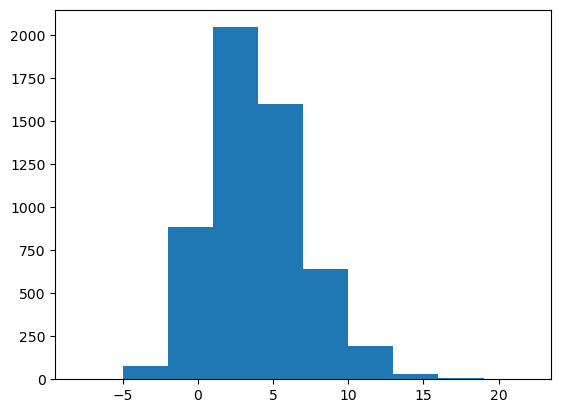

In [8]:
print(np.average(rank_diff['difference']))
plt.hist(rank_diff['difference'])
rank_diff.shape[0]

In [32]:
#Data that is determined before match performance

data = df.dropna()

data = data[data.result != "tied"]

data = data.sample(frac=1)

y = np.array(data['result'])

X = data.drop('smurf', axis = 1)
X = X.drop('date', axis = 1)
X = X.drop('result', axis = 1)
X = X.drop('rounds', axis = 1)
X = X.drop('kills', axis = 1)
X = X.drop('headshots', axis = 1)
X = X.drop('deaths', axis = 1)
X = X.drop('assists', axis = 1)
X = X.drop('damage', axis = 1)
X = X.drop('damage_received', axis = 1)
X = X.drop('econ_rating', axis = 1)
X = X.drop('plants', axis = 1)
X = X.drop('defuses', axis = 1)
X = X.drop('first_bloods', axis = 1)
X = X.drop('grenade_casts', axis = 1)
X = X.drop('ability_2_casts', axis = 1)
X = X.drop('ability_1_casts', axis = 1)
X = X.drop('ultimate_casts', axis = 1)
X = X.drop('placement', axis = 1)
X = X.drop('kdratio', axis = 1)
X = X.drop('headshot_percentage', axis = 1)
X = X.drop('first_deaths', axis = 1)
X = X.drop('last_deaths', axis = 1)


In [34]:
X = np.array(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.5)

In [35]:
#unsurprisingly this shows nothing.
#confusion matrix hovers around 50% meaning we are simply guessing 
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
rf = RandomForestClassifier(n_estimators=100, max_features=7)
rf.fit(X_train, y_train)
rf_predict=rf.predict(X_test)

# #figureout hyper parameters

# #print confusion matrix and accuracy score
rf_conf_matrix = confusion_matrix(y_test, rf_predict)
rf_acc_score = accuracy_score(y_test, rf_predict)
print(rf_conf_matrix)
accuracy = rf_acc_score*100
print(accuracy)

[[112413 153163]
 [112259 161030]]
50.744249487348405


In [37]:
data = df.dropna()

data = data[data.result != "tied"]

data = data.sample(frac=1)

y = np.array(data['result'])

X = data.drop('smurf', axis = 1)
X = X.drop('date', axis = 1)
X = X.drop('result', axis = 1)

print(X)



         rounds  kills  headshots  deaths  assists  damage  damage_received  \
963052       25     18         13      15        5    3256             2580   
907335       25     16          9      16        6    3038             2854   
172150       25     15          9      16        7    3491             3075   
747752       25     13          8      10       13    2570             2160   
342269       25     42         28      13        3    7487             4131   
...         ...    ...        ...     ...      ...     ...              ...   
757048       25     15         11      16        2    2592             3174   
822799       25     23         15      23        8    4232             3952   
569762       25      9          7      14        6    1893             2592   
1066770      25      8          7      15        3    1647             2515   
441598       25     23         10      20        6    3804             3737   

         econ_rating  plants  defuses  ...  Iron 2 

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.5)


In [42]:

from sklearn.neighbors  import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
rf = KNeighborsClassifier(n_neighbors=5)
rf.fit(X_train, y_train)
rf_predict=rf.predict(X_test)

# #figureout hyper parameters

# #print confusion matrix and accuracy score
rf_conf_matrix = confusion_matrix(y_test, rf_predict)
rf_acc_score = accuracy_score(y_test, rf_predict)
print(rf_conf_matrix)
accuracy = rf_acc_score*100
print(accuracy)

c:\Users\alecr\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


[[192515  72832]
 [ 94412 179106]]
68.9636550898648


UNSUPERVISED

In [27]:
from sklearn.cluster import MeanShift

data = df.sample(n=10000)
data = data.drop('smurf', axis = 1)
data = data.drop('date', axis = 1)
data = data.drop('')
data = data.dropna()


ms = MeanShift()
ms.fit(data)
labels = ms.labels_
cluster_centers = ms.cluster_centers_
n_clusters_ = len(np.unique(labels))
print(n_clusters_)




1442424


KeyError: "[''] not found in axis"

In [61]:
data["new_class"] = labels
print("0: ", data[data["new_class"] == 0].shape[0])
print("1: ", data[data["new_class"] == 1].shape[0])

0:  9775
1:  158


In [24]:
from matplotlib import pyplot as plt 

plt.scatter(data["damage"], data["damage_received"], c = data["new_class"])
plt.show()

NameError: name 'data' is not defined

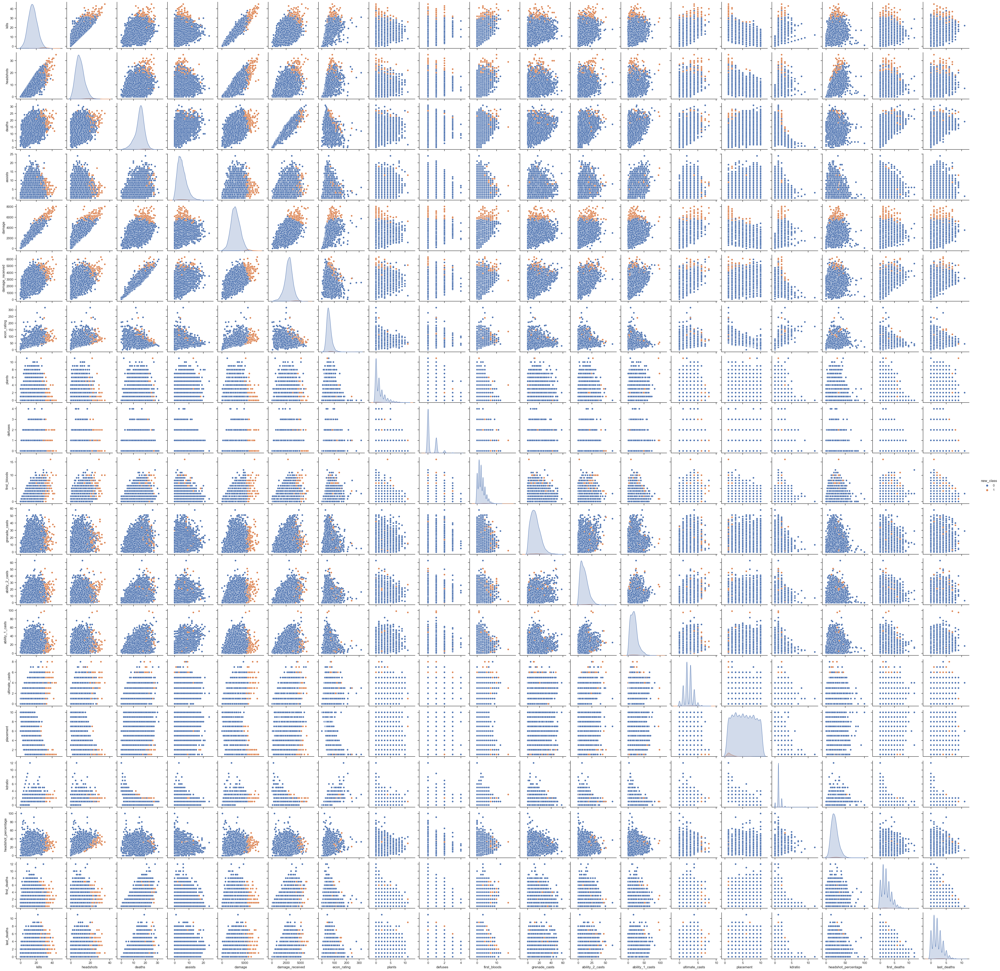

In [77]:
import seaborn as sns
new_data = data[['kills', 'headshots', 'deaths', 'assists', 'damage',
       'damage_received', 'econ_rating', 'plants', 'defuses', 'first_bloods',
       'grenade_casts', 'ability_2_casts', 'ability_1_casts', 'ultimate_casts',
       'placement', 'kdratio', 'headshot_percentage', 'first_deaths',
       'last_deaths', 'new_class']]


sns.pairplot(new_data, hue="new_class")
plt.show()

In [66]:
print(data.columns)


Index(['rounds', 'kills', 'headshots', 'deaths', 'assists', 'damage',
       'damage_received', 'econ_rating', 'plants', 'defuses', 'first_bloods',
       'grenade_casts', 'ability_2_casts', 'ability_1_casts', 'ultimate_casts',
       'placement', 'kdratio', 'headshot_percentage', 'first_deaths',
       'last_deaths', 'defeat', 'tied', 'victory', 'Ascent', 'Bind', 'Breeze',
       'Fracture', 'Haven', 'Icebox', 'Pearl', 'Split', 'Astra', 'Breach',
       'Brimstone', 'Chamber', 'Cypher', 'Fade', 'Harbor', 'Jett', 'KAY/O',
       'Killjoy', 'Neon', 'Omen', 'Phoenix', 'Raze', 'Reyna', 'Sage', 'Skye',
       'Sova', 'Viper', 'Yoru', 'Ascendant 1', 'Ascendant 2', 'Ascendant 3',
       'Bronze 1', 'Bronze 2', 'Bronze 3', 'Diamond 1', 'Diamond 2',
       'Diamond 3', 'Gold 1', 'Gold 2', 'Gold 3', 'Immortal', 'Immortal 1',
       'Immortal 2', 'Immortal 3', 'Iron 1', 'Iron 2', 'Iron 3', 'Platinum 1',
       'Platinum 2', 'Platinum 3', 'Radiant', 'Silver 1', 'Silver 2',
       'Silver 3', 'Unr

Outliers VS Averages

The reason that smurfs are considered an issue in competetive games is because they are at a competetive advantage over other players. in VALORANT this will generally result in higher damage, kills, kda, headshots, firstbloods and lower deaths. In many cases these assumptions are flipped if a smurf is intentionally losing a game, otherwise known as throwing. In this next section we will examine any trends that appear outside of the standard deviations of statistics. 

In [42]:
#Kills
sd = np.std(df['kills'])
mean = np.mean(df['kills'])
kills = df.loc[(df['kills'] > mean+sd) | (df['kills'] < mean-sd)]

print(kills.shape[0])



455796


In [46]:
from sklearn.cluster import MeanShift
data = kills.sample(n=100)
data = data.drop('smurf', axis = 1)
data = data.drop('date', axis = 1)

data = data.dropna()


ms = MeanShift()
ms.fit(data)
labels = ms.labels_
cluster_centers = ms.cluster_centers_
n_clusters_ = len(np.unique(labels))
print(n_clusters_)

2


In [47]:
data["new_class"] = labels
print("0: ", data[data["new_class"] == 0].shape[0])
print("1: ", data[data["new_class"] == 1].shape[0])

0:  57
1:  41


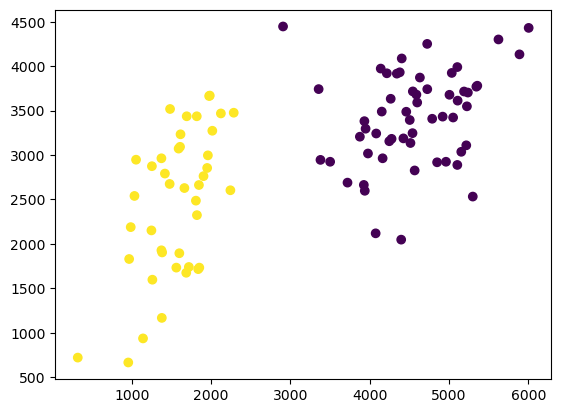

In [48]:
from matplotlib import pyplot as plt 

plt.scatter(data["damage"], data["damage_received"], c = data["new_class"])
plt.show()

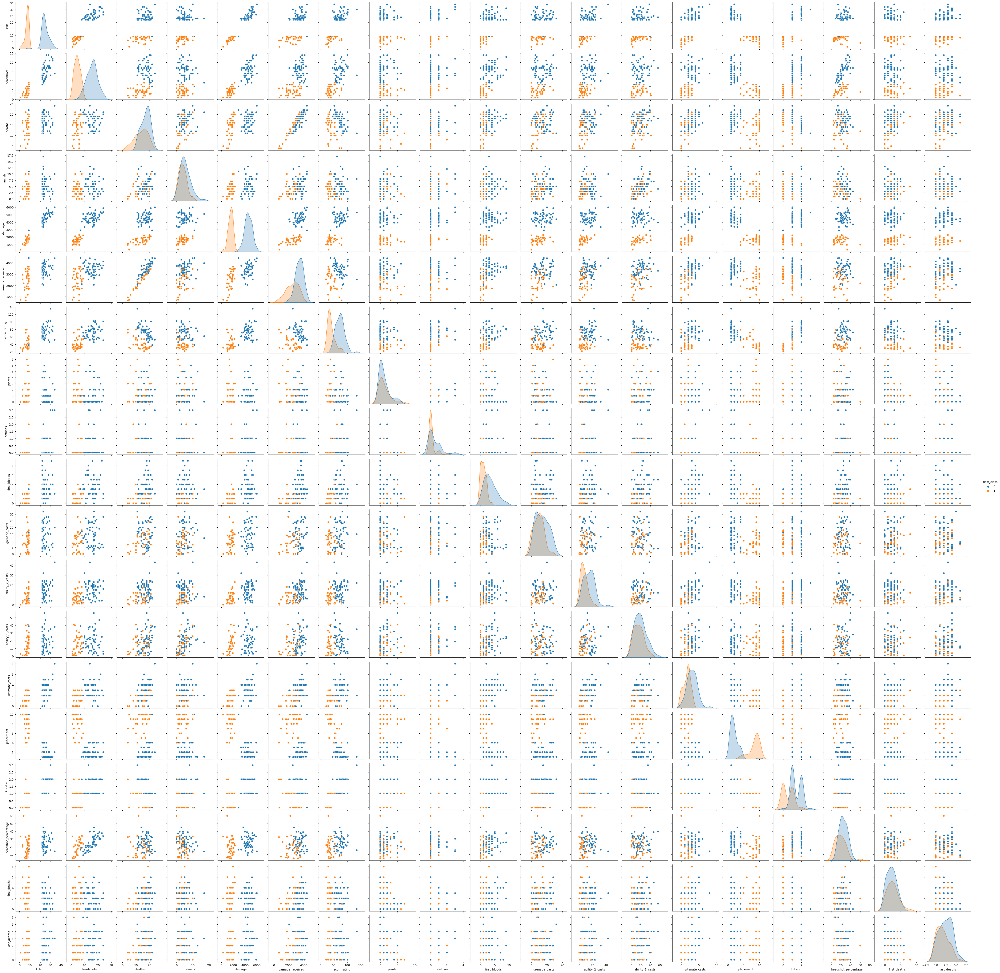

In [49]:
import seaborn as sns
new_data = data[['kills', 'headshots', 'deaths', 'assists', 'damage',
       'damage_received', 'econ_rating', 'plants', 'defuses', 'first_bloods',
       'grenade_casts', 'ability_2_casts', 'ability_1_casts', 'ultimate_casts',
       
       'placement', 'kdratio', 'headshot_percentage', 'first_deaths',
       'last_deaths', 'new_class']]


sns.pairplot(new_data, hue="new_class")
plt.show()